# Import Libraries

In [1]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd

# Augmentation

In [2]:
def plot(wav,title):
    fig = plt.figure(figsize=(16, 6))
    librosa.display.waveplot(wav,sr=sr)
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.show()

In [3]:
def add_noise(data, noise_factor):
    noise = np.random.randn(len(data))
    augmented_data = data + noise_factor * noise
    # Cast back to same data type
    augmented_data = augmented_data.astype(type(data[0]))
    return augmented_data

In [4]:
def time_shift(data, sampling_rate,factor):
    return np.roll(data,int(sampling_rate/factor))

In [5]:
def pitch_change(data, sampling_rate, pitch_factor):
    return librosa.effects.pitch_shift(data, sampling_rate, pitch_factor)

In [6]:
def speed_change(data, speed_factor):
    return librosa.effects.time_stretch(data, speed_factor)

In [7]:
wav, sr = librosa.load('new_audio/afrikaans1.wav',sr=22050)
wav_noise = add_noise(wav,0.005) # Permissible noise factor value, x > 0.004
wav_shift = time_shift(wav,sr,10) # Permissible shift factor value, x = 10
wav_pitch = pitch_change(wav,sr,2) # Permissible factor values = -5 <= x <= 5
wav_speed = speed_change(wav,0.2) # Permissible speed factor values = 0 < x < 1.0

# Hear Variations

In [8]:
ipd.Audio(wav, rate=sr)

In [9]:
ipd.Audio(wav_noise, rate=sr)

In [10]:
ipd.Audio(wav_shift, rate=sr)

In [11]:
ipd.Audio(wav_pitch, rate=sr)

In [12]:
ipd.Audio(wav_speed, rate=sr)

# See Variations

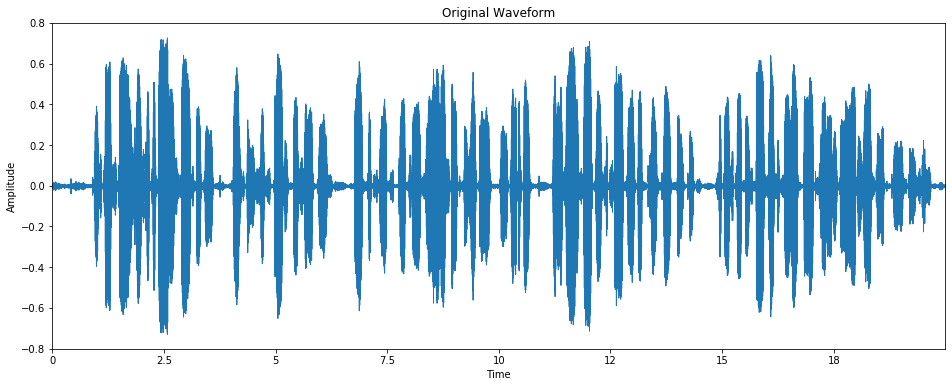

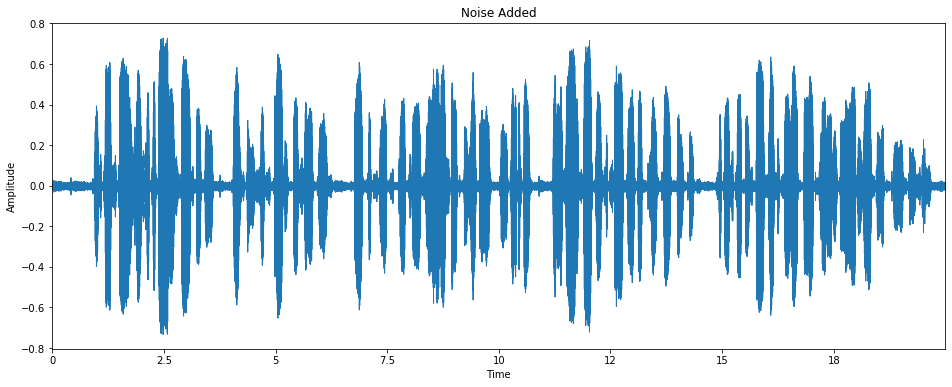

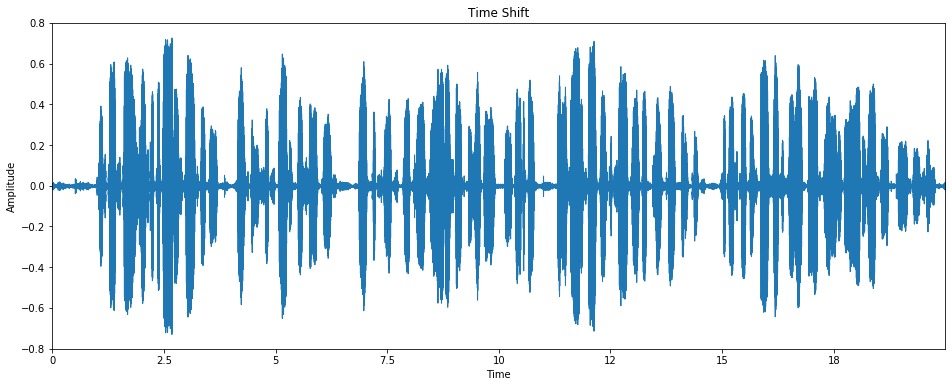

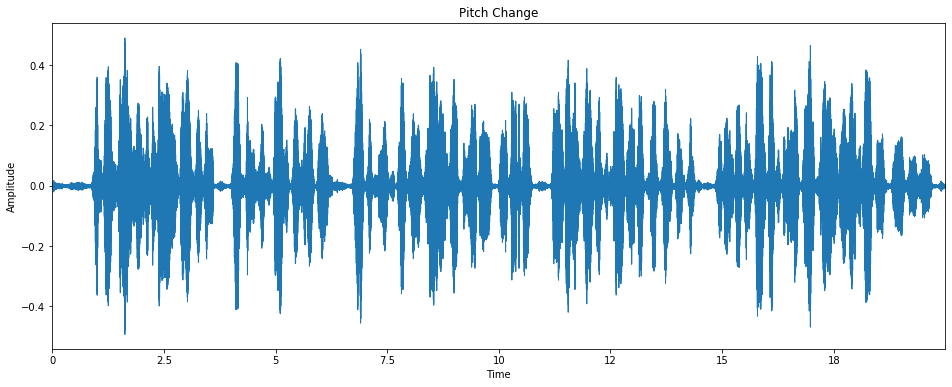

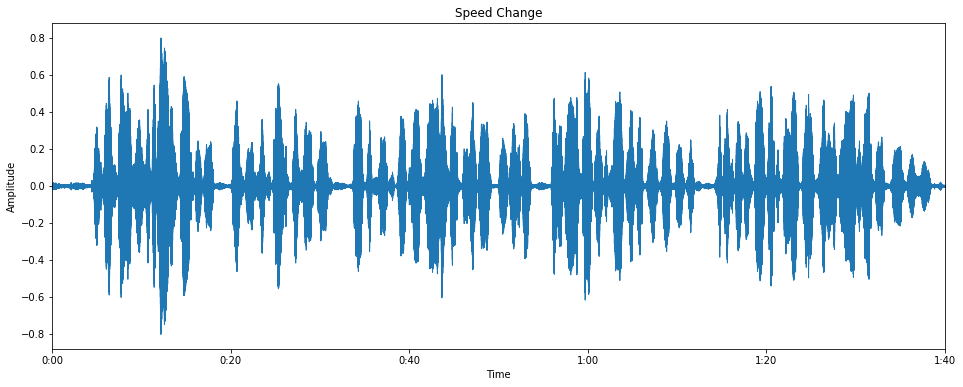

In [13]:
l1=[wav,wav_noise,wav_shift,wav_pitch,wav_speed]
l2=['Original Waveform','Noise Added','Time Shift','Pitch Change','Speed Change']
for i,j in zip(l1,l2):
    plot(i,j)

# Save output audio files

In [14]:
for i,j in zip(l1[1:],l2[1:]):
    librosa.output.write_wav('new_audio/'+j+'.wav',i,sr)